## 프로젝트 : 다양한 OCR모델 비교하기

### 필요한 라이브러리 import

In [1]:
import os
import matplotlib.pyplot as plt
import keras_ocr
import pytesseract
from PIL import Image
from pytesseract import Output
from glob import glob
from google.cloud import vision
import io
import cv2

### 검증용 데이터셋 준비

In [2]:
# 메뉴 사진 10장

image_paths = sorted(glob('./data/*.*'))

images = []
for path in image_paths:
    images.append(cv2.imread(path))

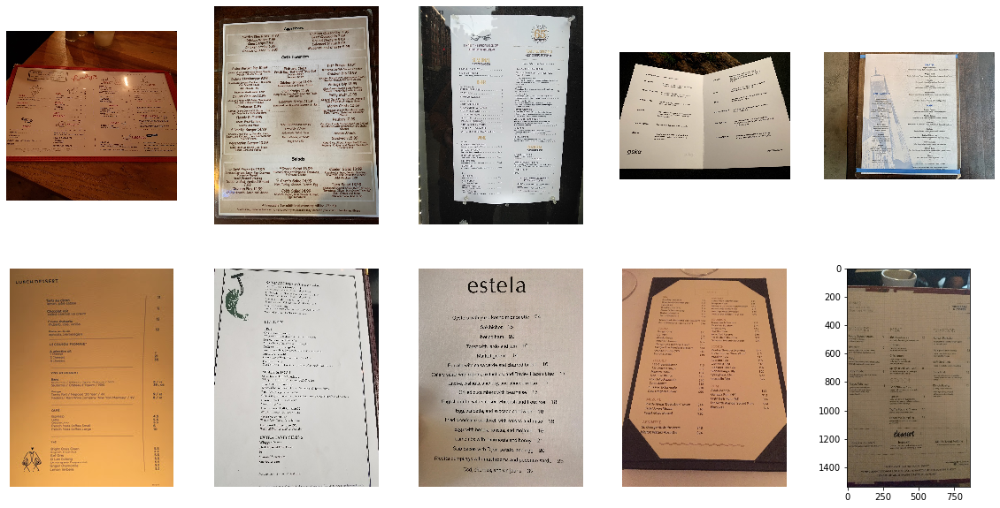

In [11]:
# 이미지 확인

plt.figure(figsize=(20, 10))
for i, image in enumerate(images):
    plt.axis('off')
    plt.subplot(2, 5, i+1)
    plt.imshow(image)

### Google OCR API, keras-ocr, Tesseract로 테스트 진행

**google cloud vision api**

In [12]:
def detect_text(path):
    """Detects text in the file."""
    client = vision.ImageAnnotatorClient()

    with io.open(path, 'rb') as image_file:
        content = image_file.read()
        
    image = vision.Image(content=content)

    response = client.text_detection(image=image)
    texts = response.text_annotations
    print('Texts:')

    for text in texts:
        print('\n"{}"'.format(text.description))

    vertices = (['({},{})'.format(vertex.x, vertex.y) for vertex in text.bounding_poly.vertices])

    print('bounds: {}'.format(','.join(vertices)))

    if response.error.message:
        raise Exception(
            '{}\nFor more info on error messages, check: '
            'https://cloud.google.com/apis/design/errors'.format(response.error.message))

In [17]:
# 다운받은 인증키 경로가 정확하게 지정되어 있어야 합니다. 
!ls -l $GOOGLE_APPLICATION_CREDENTIALS

os.environ["GOOGLE_APPLICATION_CREDENTIALS"] =  os.getenv('HOME')+'/aiffel/ocr_python/my_google_api_key.json'

# 위에서 정의한 OCR API 이용 함수를 호출해 봅시다.

for path in image_paths:
    print("----------------------------------------------------------------------------------------------")
    detect_text(path)

-rw-rw-r-- 1 aiffel aiffel 2346  3월 12 11:29 /home/aiffel/aiffel/ocr_python/my_google_api_key.json
----------------------------------------------------------------------------------------------
Texts:

"BREAKFAST LUNCH
DINNER
OPEN 7 DAYS RAM OPN
SONO MURRAY HILL EAST VILLACE COMINC SOON
Rubye
O GLITTLERUBY GRUBYSCAFE
foresh
JUICES
(equCEZED IN MOUSE DAL7
A CUP OF..COFFEE
ORANGE JUICE
lesr
COFFEE ( ARY
GRAPEFRUIT JUICE
&ROTTLCD
COLD BREU
PINEAPPLE& MINT
CAFE AMERICANG/LONG BLACK
WATERMELON
& LIME JUICE
FRESH YOUNG COCONUT
CAFE LATTTE/CAPPUCIND/FLAT WHITE/MOCHA
CHAI LATTE
REDS
MATCHA LATTE
BEER
PINOT NOIR
ESPRESSO
10
36
RUBY'S LEMONADE
LUCKY BEER LAGER
CABERNET SAUVIGNON
ICED LATTE
STRAWBERRY
BASIL LEMONADE
10
36
COOPERS CREEN PALE ALE
MALBEC
HOT CHOCOLATE
37
MATCHA LEMONADE
ALMOND
DAT
SOy I COCONUT DS
55
DRAUGHT
WHITES
NARRAGANSETT LAGER
PINOT GRIGIO
BEVVIES
TEA
10
36
6.
CHARDONNAY
FOUNDERS IPA
ENGLISH BREAKIE/EARL GREY/PEPPERMINT
/GREEN/CHAMOMILE
7.
10
36
SPARKLING WATER
SAUV BLANC
35/

Texts:

"VESELEA
65
ANNIVERSART
CMAere
LIMITED TIME SPECIALS FOR OUR
UKRAINIAN SPRING MENU
FEATURED SPECIALS
OF THE WEEK
SEASONAL
BEVERAGES
All specials are available at 12 noon!
HONEY MINT GINGER ICE TEA,
SEASONAL SOUP: TOMATO BISQUE
6/9
RASPBERRY LEMONADE
CLASSIC UKRAINIAN VESELKA PIEROGI BOWL
Served four ways:
Our house specialty made with real raspberries....
BEER
1) 65th Anniversary Bowl
Two potato, two meat, and two sauerkraut mushrooni pierogi
topped with caramelized onion, grilled kielbasa,
and slab bacon.....
14
................. ..
Draft Beer (20 oz):
) Meat
2) A
Three short rib and three meat pierogi with slab bacon
and caramelized onion .. ..... .
OBOLON LAGER (UKRAINE),
8.
13
ZYWIEC (POLAND)
3) Vegetarian
PILSNER URQUELL (CZECH)
Six potato pierogi topped with Brinza cheese (feta cheese
from sheep milk) and ehopped green onions.
12
4) Cherry & Cheese
Six Cherry & Cheese pierogi filled with sour cherries
and farmer's cheese and topped with a cherry compote
Bottled Beer:
LVIV

Texts:

"STARTER
n
BAR FAVO
MAIN
De e
ing
in o w d hecks
"

"STARTER"

"n"

"BAR"

"FAVO"

"MAIN"

"De"

"e"

"ing"

"in"

"o"

"w"

"d"

"hecks"
bounds: (264,260),(281,260),(281,263),(264,263)
----------------------------------------------------------------------------------------------
Texts:

"LUNCH DESSERT
Tata e
tie
Chcot so
sad a
Coe Phari
12
Alsn
Che
Vt E EERT
Ts P/eco30 /
M Cony a
CAE
frh sa Ca
nan r er
Sulang
Lemen epe
anger Chamowle
Len Dena
"

"LUNCH"

"DESSERT"

"Tata"

"e"

"tie"

"Chcot"

"so"

"sad"

"a"

"Coe"

"Phari"

"12"

"Alsn"

"Che"

"Vt"

"E"

"EERT"

"Ts"

"P/eco30"

"/"

"M"

"Cony"

"a"

"CAE"

"frh"

"sa"

"Ca"

"nan"

"r"

"er"

"Sulang"

"Lemen"

"epe"

"anger"

"Chamowle"

"Len"

"Dena"
bounds: (64,247),(78,247),(78,249),(64,249)
----------------------------------------------------------------------------------------------
Texts:

"SANDWICHES w/fries or salad
Paris BLT on a Ciabatta Roll 11.
Butter Lettuce, Tomato, Srivacha Mayo. Pickle
Grilled Chicken Sa

Texts:

"DINNER
Sun Wed 6-1PM
Thors Sat 6 PM-12 AM
THUASDAY
KITCHEN
VEGGIES
MEAT
SEAFOOD
Angry Sweet Potato
sriracha goat cheese,
chilli pepper (spicyl
Steak (medium-rare)
12
soy-garlic glaze, feta grits, sautéed kale
Korean Pancake
13
mixed seafood, serrano peppers (spicy.
housemade ponzu
Chicken
11
Avocado
9.
sweet and spicy sauce,
black sesame crumbles
Octopus (served chilled)
12
greens vinaigrette, pickled radish,
yuzu sour aeme, shichimi pepper
Chicharron
korean pear, sweet soy-scallion
riesling gellée, mango
11
Kale
9.
stilton (blue cheese)-daikon vinaigrette,
mung bean sprout, brussel sprout
confit-style pork belly,
cashew crème, white kimchi
lime juice, cilantro
Soft Shell Crab
11
wasabi remoulade, pickeled tomatoes
Spicy Pulled Pork Taco
8.
8
Ugly Potato
smoky gochujang pickled pineapple
hazelnut crumbles, scallions
Tuna Tataki
12
crispy fingerling potato, feta cheese,
smoky bbq sauce
hummus coulis, sesame vinaigrette
Crunchy quinoa serrano pepper ispicyl.
STARCH
sumac
Mapo To

**keras-ocr**

In [18]:
pipeline = keras_ocr.pipeline.Pipeline()

prediction_groups = [pipeline.recognize([url]) for url in image_paths]

Looking for /home/aiffel/.keras-ocr/craft_mlt_25k.h5
Instructions for updating:
Create a `tf.sparse.SparseTensor` and use `tf.sparse.to_dense` instead.
Looking for /home/aiffel/.keras-ocr/crnn_kurapan.h5


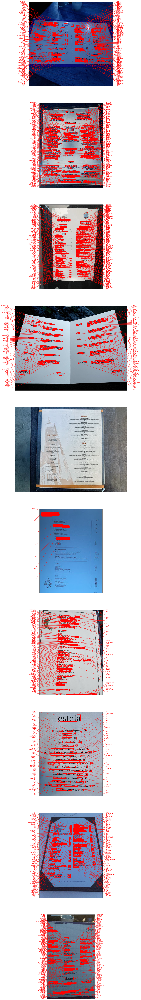

In [24]:
fig, axs = plt.subplots(nrows=len(images), figsize=(200, 200))
for idx, ax in enumerate(axs):
    keras_ocr.tools.drawAnnotations(image=images[idx],  # image에 cv2 이미지 전달해야 하는듯. Image.open으로 연 이미지 X
                                    predictions=np.array(prediction_groups[idx][0]), ax=ax)

**Tesseract**

In [15]:
# 문자 검출하고 이미지 자르기 (detection)

def crop_word_regions(image_path='./images/sample.png', output_path='./output'):
    if not os.path.exists(output_path):
        os.mkdir(output_path)
    custom_oem_psm_config = r'--oem 3 --psm 3'
    image = Image.open(image_path)

    recognized_data = pytesseract.image_to_data(
        image, lang='eng',    # 한국어라면 lang='kor'
        config=custom_oem_psm_config,
        output_type=Output.DICT
    )
    
    top_level = max(recognized_data['level'])
    index = 0
    cropped_image_path_list = []
    for i in range(len(recognized_data['level'])):
        level = recognized_data['level'][i]
    
        if level == top_level:
            left = recognized_data['left'][i]
            top = recognized_data['top'][i]
            width = recognized_data['width'][i]
            height = recognized_data['height'][i]
            
            output_img_path = os.path.join(output_path, f"{str(index).zfill(4)}.png")
            print(output_img_path)
            if left and top and width and height:
                cropped_image = image.crop((
                    left,
                    top,
                    left+width,
                    top+height
                ))
                cropped_image.save(output_img_path)
                cropped_image_path_list.append(output_img_path)
                index += 1
    return cropped_image_path_list


# 잘린 이미지에서 단어 인식하기

def recognize_images(cropped_image_path_list):
    custom_oem_psm_config = r'--oem 3 --psm 7'
    
    for image_path in cropped_image_path_list:
        image = Image.open(image_path)
        recognized_data = pytesseract.image_to_string(
            image, lang='eng',    # 한국어라면 lang='kor'
            config=custom_oem_psm_config,
            output_type=Output.DICT
        )
        print(recognized_data['text'])
    print("Done")

In [27]:
cropped_image_path_list = []
for path in image_paths:
    dir_name = os.path.splitext(os.path.basename(path))[0]
    os.mkdir(f'./output/{dir_name}')
    cropped_image_path_list.append(crop_word_regions(path, f'./output/{dir_name}'))

./output/1/0000.png
./output/1/0001.png
./output/1/0002.png
./output/1/0003.png
./output/1/0004.png
./output/1/0005.png
./output/1/0006.png
./output/1/0007.png
./output/1/0008.png
./output/1/0009.png
./output/1/0010.png
./output/1/0011.png
./output/1/0012.png
./output/1/0013.png
./output/1/0014.png
./output/1/0015.png
./output/1/0016.png
./output/1/0017.png
./output/1/0018.png
./output/1/0019.png
./output/1/0020.png
./output/1/0021.png
./output/1/0022.png
./output/1/0023.png
./output/1/0024.png
./output/1/0025.png
./output/1/0026.png
./output/1/0027.png
./output/1/0028.png
./output/1/0029.png
./output/1/0030.png
./output/1/0031.png
./output/1/0032.png
./output/1/0033.png
./output/1/0034.png
./output/1/0035.png
./output/1/0036.png
./output/1/0037.png
./output/1/0038.png
./output/1/0039.png
./output/1/0040.png
./output/1/0041.png
./output/1/0042.png
./output/1/0043.png
./output/1/0044.png
./output/1/0045.png
./output/1/0046.png
./output/1/0047.png
./output/1/0048.png
./output/1/0049.png


./output/2/0000.png
./output/2/0001.png
./output/2/0002.png
./output/2/0003.png
./output/2/0004.png
./output/2/0005.png
./output/2/0006.png
./output/2/0007.png
./output/2/0008.png
./output/2/0009.png
./output/2/0010.png
./output/2/0011.png
./output/2/0012.png
./output/2/0013.png
./output/2/0014.png
./output/2/0015.png
./output/2/0016.png
./output/2/0017.png
./output/2/0018.png
./output/2/0019.png
./output/2/0020.png
./output/2/0021.png
./output/2/0022.png
./output/2/0023.png
./output/2/0024.png
./output/2/0025.png
./output/2/0026.png
./output/2/0027.png
./output/2/0028.png
./output/2/0029.png
./output/2/0030.png
./output/2/0031.png
./output/2/0032.png
./output/2/0033.png
./output/2/0034.png
./output/2/0035.png
./output/2/0036.png
./output/2/0037.png
./output/2/0038.png
./output/2/0039.png
./output/2/0040.png
./output/2/0041.png
./output/2/0042.png
./output/2/0043.png
./output/2/0044.png
./output/2/0045.png
./output/2/0046.png
./output/2/0047.png
./output/2/0048.png
./output/2/0049.png


./output/5/0000.png
./output/6/0000.png
./output/6/0001.png
./output/6/0002.png
./output/6/0003.png
./output/6/0003.png
./output/6/0003.png
./output/6/0003.png
./output/6/0004.png
./output/6/0005.png
./output/6/0006.png
./output/6/0007.png
./output/6/0008.png
./output/6/0009.png
./output/6/0010.png
./output/6/0011.png
./output/6/0012.png
./output/6/0013.png
./output/6/0014.png
./output/6/0015.png
./output/6/0016.png
./output/6/0017.png
./output/6/0018.png
./output/6/0019.png
./output/6/0020.png
./output/6/0021.png
./output/6/0022.png
./output/6/0023.png
./output/6/0024.png
./output/6/0025.png
./output/6/0026.png
./output/6/0027.png
./output/6/0028.png
./output/6/0029.png
./output/6/0030.png
./output/6/0031.png
./output/6/0032.png
./output/6/0033.png
./output/6/0034.png
./output/6/0035.png
./output/6/0036.png
./output/6/0037.png
./output/6/0038.png
./output/6/0039.png
./output/6/0040.png
./output/6/0041.png
./output/6/0042.png
./output/6/0043.png
./output/6/0044.png
./output/6/0045.png


./output/9/0000.png
./output/9/0001.png
./output/9/0002.png
./output/9/0003.png
./output/9/0004.png
./output/9/0005.png
./output/9/0006.png
./output/9/0007.png
./output/9/0008.png
./output/9/0009.png
./output/9/0010.png
./output/9/0011.png
./output/9/0012.png
./output/9/0013.png
./output/9/0014.png
./output/9/0015.png
./output/9/0016.png
./output/9/0017.png
./output/9/0018.png
./output/9/0019.png
./output/9/0020.png
./output/9/0021.png
./output/9/0022.png
./output/9/0023.png
./output/9/0024.png
./output/9/0025.png
./output/9/0026.png
./output/9/0027.png
./output/9/0028.png
./output/9/0029.png
./output/9/0030.png
./output/9/0031.png
./output/9/0032.png
./output/9/0033.png
./output/9/0034.png
./output/9/0035.png
./output/9/0036.png
./output/9/0037.png
./output/9/0038.png
./output/9/0039.png
./output/9/0040.png
./output/9/0041.png
./output/9/0042.png
./output/9/0043.png
./output/9/0044.png
./output/9/0045.png
./output/9/0046.png
./output/9/0047.png
./output/9/0048.png
./output/9/0049.png


In [28]:
# 위에서 준비한 문자 영역 파일들을 인식하여 얻어진 텍스트를 출력합니다.

for l in cropped_image_path_list:
    print("----------------------------------------------------------------------------------------------")
    recognize_images(l)

----------------------------------------------------------------------------------------------
BREAKFAST

F

LUNCwW

Cat” =

OPEN

J

UAYS

BEER

Lorn,

SErRr

lL ACER

CVUUPEIRS

CRITWN

PALF

Ais

DRAUGHT

NARRAGANSETT

[LAGER

FOUNDERS

iPA

AiMOSAS


Us

WATERMELON

an

GRAPEFRUIT

5ivUCDY

TAKS

(WEEKENDS

ONLY)

i)

SANGRIA

> +

REDS

PINOT

NUIR

-

-ABERNET

2»AUVIGNON

MALBEC

WHITES

PINOUT

LRIGID

CHARDONNAY

SAUY

BLAND

ROSE

PRUSECCO

KUB?y'S

SPRIT

Fee

—

APEROL

PROSECCO

SUDA

WATER

4

JRANGE

FRUZEN

MARGARITAS

sal

PL ASSIC

gc

WATE RNE!L UN

-

PASSIUN? RUIT

WATERMELUN

POOLER

CLonsuming

(aw

cr

undercooked

Meatless.

pouitry,

seafood,

shellfish

.) i

CRESS

iy

ALtLt £ Cal &

yvus

risk

or

foodborne

iilness

Pros

JUICES

UVRANGE

JUICE

VRAPEFPRUIT

JUICE

PINEAPPLE

P

ring

WADTERMELOWN

-

LIME

JUICE

rREGH

FUUNG

CUCONUT

KnUs7'S

LEMUNADE


_ NOooOlate

Strawberry

UHERR

T PIERUG

JESSERT

Three

irieg

cherry

Tele

chee ae

a

LOp pec

with

ia

. sc)

or

i.

City &

Vanilla

ic

Troe


rhocolate

a

IF MUN

MERINGUE

M1) Po

wht iit. I>

CHEESE

MONTH:

THE

rFINAT,

DoAYS

MONDAY

Fontins

Braise

ih aie

arc

Pepper

iUPSUA)

Bacon,

Apple.

cg

Chedaar

oeelaecla

ty

ror

Porc

sty

£15.00

Done
----------------------------------------------------------------------------------------------
“Oh iro,

=o p

“~NG

der

NOwe

2 ed

YVIT hy

i

“Me@gar

iMperia}

Yscietra

-dUce

mode

from

juice

ong

whey

©Ovioar,

Cabbage.

Gulse.

rermente

cd aspa

‘[Qgus

OOV

black

tT

BIRCHW

woodruft

syrup

“ANGOUSTINE

fail,

Drain

ong

clow

With

chamomile

7

Koc olate

OO

ispy '!

ONION

Grilled

Onion

Gir)

qd scallop

with

J

broth

MIGNARDISES

Chewy

heet

|

Crisp

mMmad

e from

roasted

onion

ond

bl



THUASDAY

Tt

Done


### 테스트 결과 정리

메뉴의 글자를 인식했기 때문에 인식한 글의 양이 너무 많아서 시각화를 하기엔 어렵다.   
셀 실행 결과를 기준으로 비교하면, 성능은 Google OCR API > keras-ocr >= Tesseract 순이었다.   
확실하게 성능 차이를 볼 수 있는 기준으로 해상도가 낮은 이미지인 5, 6번에 대한 결과를 비교해보면, google ocr은 두 이미지 모두 문자라고 부를 수 있는 걸 인식했다.   
하지만 keras-ocr은 5번 이미지에선 아무것도 인식하지 못했고, 6번 이미지에선 잘못된 문자로 인식했다.   
마지막으로 Tesseract는 5번과 6번 모두 아무 것도 인식하지 못했다.   
게다가 인식률 성능 순서대로 인식의 정확도도 차이났다.   
첫 번째 이미지를 기준으로 하면 BREAKFAST, LUNCH, DINNER라는 문자열을 기준으로 하면,  google ocr은 BREAKFAST, LUNCH, DINNER라고 정확하게 인식하지만, keras-ocr은 BREAKFAST를 breake, ast로 인식했고, lunch는 lunch로 정확하게 인식했으며, dinner는 dunner로 인식했다.  
마지막으로, Tesseract는 BREAKFAST, LUNCH를 BREAKFAST, LUNCwW로 인식했고, DINNER는 아예 알아볼 수 있는 문자열로 인식하지 않았다.

### 결과 분석과 결론 제시

**구현하고자 하는 서비스의 목적과 내용**   
   
메뉴에 있는 문자열들을 인식해, 식당의 메뉴 정보를 활용하는 서비스를 생각하고 OCR을 활용하는 시도를 했다.   
준비한 이미지는 모두 메뉴 이미지로, 메뉴와 주 재료, 금액 등의 정보를 담고 있고, 이 정보들을 추출하는 것이 목표였다.


**검토한 OCR 모델들이 그 목적에 부합하는지 확인하기 위해 필요한 평가기준**   
   
정보를 추출해 활용하는 것이 목적이므로, 평가 기준은 정확성이다.   
이미지 내에서 글자가 기울어있거나, 그림자가 져 있거나, 조명이 어둡거나 하는 상황에도 글자를 정확하게 인식해야 한다.   


**테스트 결과를 분석하여 가장 나은 대안의 모델을 선정**   
   
평가 기준을 근거로 가장 훌륭한 모델은 google ocr api라고 생각한다.   

### 회고 + 루브릭

메뉴에 있는 문자열들을 인식해, 식당의 메뉴 정보를 활용하는 서비스를 생각하고 OCR을 활용하는 시도를 해봤다.   
아무래도 특정 식당의 메뉴 사진을 보고 메뉴와 정보, 가격을 하나하나 입력하는 것은 비효율적이기 때문에 OCR을 활용해 문자를 인식하는 게 더 효율적일 것이다.   
   
OCR을 활용하기 위해 Google OCR API, keras-ocr, Tesseract의 세 기술을 사용해봤는데, 작성한 순서대로 인식률이 높았다.   
예를 들면, 5번째 이미지와 6번째 이미지는 해상도가 좋지 않아 keras-ocr, Tesseract는 5번째 이미지에서 아예 어떤 문자열도 인식하지 못했고, 6번째 이미지에선 인식을 하더라도 스펠링이 틀리거나 아예 의미없는 문자열로 인식했다.   
그에 반해 Google OCR은 해상도가 낮더라도 나름의 의미있는 인식 결과를 냈다.(물론 서비스화 하기엔 부족해보인다.)   
   
이번 노드에서 OCR에 대해 관심이 좀 생겼다.   
이미지 자체가 해상도가 낮아 글씨를 알아보기 힘든 상태라면 어렵겠지만, 인식의 정확성을 높일 수 있는 방법도 있는지 궁금하다.   
예를 들어 앞에서 학습했던 SRGAN을 이용해 글자를 인식할 수 있을 정도로 해상도를 높일 수 있게 되면 이번 노드에서 사용한 API들의 인식률이 올라갈지 궁금하다.